## **Загрузка необходимых библиотек и компонентов**

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
from math import log2
%load_ext tensorboard

C:\Users\IlyaKuz\anaconda3\envs\ct_gan\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## **Общие  новые слои**

In [3]:
"""Коэффициенты используются в критике и генераторе для определения того, насколько
каналы должны быть умножены и расширены для каждого слоя,
поэтому, в частности, для первых  слоев каналы остаются неизменными,
тогда как при увеличении img_size (по отношению к более поздним слоям)
мы уменьшаем количество каналов на 1/2, 1/4"""
factors = [1, 1, 1, 1, 1 / 2, 1 / 4, 1 / 8]
#factors = [1, 1, 1, 1, 1 / 2]

In [4]:
class WSConv2d(nn.Module):

    def __init__(
        self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, gain=2
    ):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (gain / (in_channels * (kernel_size ** 2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        # initialize conv layer
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)

class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

In [5]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_pixelnorm=True):
        super(ConvBlock, self).__init__()
        self.use_pn = use_pixelnorm
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)
        self.pn = PixelNorm()

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.pn(x) if self.use_pn else x
        x = self.leaky(self.conv2(x))
        x = self.pn(x) if self.use_pn else x
        return x

## **Модель генератора**

In [6]:
class Generator(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()
        # началльное преобразование 1x1 -> 4x4
        self.initial = nn.Sequential(
            PixelNorm(),
            nn.ConvTranspose2d(z_dim, in_channels, 4, 1, 0),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            PixelNorm(),
        )
        self.initial_rgb = WSConv2d(
            in_channels, img_channels, kernel_size=1, stride=1, padding=0
        )
        self.prog_blocks, self.rgb_layers = (
            nn.ModuleList([]),
            nn.ModuleList([self.initial_rgb]),
        )

        for i in range(len(factors) - 1):  # -1 чтобы предотвратить ошибку выхода индекса за пределы массива из-за factors[i+1]
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(ConvBlock(conv_in_c, conv_out_c))
            self.rgb_layers.append(
                WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0)
            )
    def fade_in(self, alpha, upscaled, generated):
        # alpha должно быть скалярным в пределах [0, 1], и upscale.shape == generated.shape
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, x, alpha, steps):
        out = self.initial(x)

        if steps == 0:
            return self.initial_rgb(out)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="nearest")
            out = self.prog_blocks[step](upscaled)

        # Число каналов upscale Остаеться постоянным, в то время как при прохождение через prog_blocks оно может измениться. 
        # Поэтому мы пропускаем их через разные rgb_layers
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)
        return self.fade_in(alpha, final_upscaled, final_out)


## **Модель критика**

In [7]:
class Critic(nn.Module):
    def __init__(self, z_dim, in_channels, img_channels=3):
        super(Critic, self).__init__()
        self.prog_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)

        # Мы идем в обратном направлении, потому что критик должен зеркално отражать генератор
        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out, use_pixelnorm=False))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )


        self.initial_rgb = WSConv2d(
            img_channels, in_channels, kernel_size=1, stride=1, padding=0
        )
        self.rgb_layers.append(self.initial_rgb)
        self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)  # avg pool используется для уменьшения изображения вдвое 

        # блок для изображения 4x4 
        self.final_block = nn.Sequential(
            # +1 к in_channels поскольку мы брибавляем слой MiniBatch std
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, 1, kernel_size=1, padding=0, stride=1)
        )

    def fade_in(self, alpha, downscaled, out):
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )

        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):

        cur_step = len(self.prog_blocks) - steps


        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:  #image is 4x4
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)


        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))

        # в отличии от генератора fade_in выполняется сначала между уменьшенным масштабом и входом 
        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)

## **Градиентный штраф**

In [8]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)
   
    mixed_scores = critic(interpolated_images, alpha, train_step)

    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

## **Функция для записи результата**

In [9]:
def plot_to_tensorboard(
    writer, loss_critic, loss_gen, real, fake, tensorboard_step
):
    writer.add_scalar("Loss Critic", loss_critic, global_step=tensorboard_step)

    with torch.no_grad():

        img_grid_real = torchvision.utils.make_grid(real[:8], normalize=True)
        img_grid_fake = torchvision.utils.make_grid(fake[:8], normalize=True)
        writer.add_image("Реальные изображения КТ грудной клетки", img_grid_real, global_step=tensorboard_step)
        writer.add_image("Сгенерированные изображения КТ грудной клетки", img_grid_fake, global_step=tensorboard_step)

## **Настройка гипперпараметров**

In [10]:
START_TRAIN_AT_IMG_SIZE = 4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-3
BATCH_SIZES = [64, 64, 32, 32, 16, 16, 8]
CHANNELS_IMG = 1
Z_DIM = 128  
IN_CHANNELS = 128 
CRITIC_ITERATIONS = 3
LAMBDA_GP = 10
PROGRESSIVE_EPOCHS = [30] * len(BATCH_SIZES)
FIXED_NOISE = torch.randn(16, Z_DIM, 1, 1).to(DEVICE)
NUM_WORKERS = 4

## **Загрузка и трансформация изображений**

In [11]:
from google.colab import drive
drive.mount('/content/drive/')

ModuleNotFoundError: No module named 'google.colab'

In [26]:
from torchvision.transforms.functional import adjust_contrast
from torchvision.transforms.functional import rotate
from torchvision.transforms.transforms import Grayscale
def get_loader(image_size):
    transform = transforms.Compose(
        [
            transforms.Grayscale(num_output_channels=1),
            transforms.Resize((image_size, image_size)),
            rotate(angle = 90),
            transforms.ToTensor(),
            transforms.Normalize(
                [0.5 for _ in range(CHANNELS_IMG)],
                [0.5 for _ in range(CHANNELS_IMG)],
            ),
        ]
    )
    batch_size = BATCH_SIZES[int(log2(image_size / 4))]
    
    dataset = datasets.ImageFolder(root="../data/patients_png", transform=transform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    
    return loader, dataset

In [ ]:
get_loader(128)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


(<torch.utils.data.dataloader.DataLoader at 0x7f65c8a16190>,
 Dataset ImageFolder
     Number of datapoints: 540
     Root location: /content/drive/My Drive/УИРС/CT_png
     StandardTransform
 Transform: Compose(
                Grayscale(num_output_channels=1)
                Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=None)
                ToTensor()
                Normalize(mean=[0.5], std=[0.5])
            ))

## **Просмотр обработанных изображений**

In [17]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline 

In [27]:
loader, data = get_loader(256)

TypeError: rotate() missing 1 required positional argument: 'img'

torch.Size([8, 1, 256, 256])


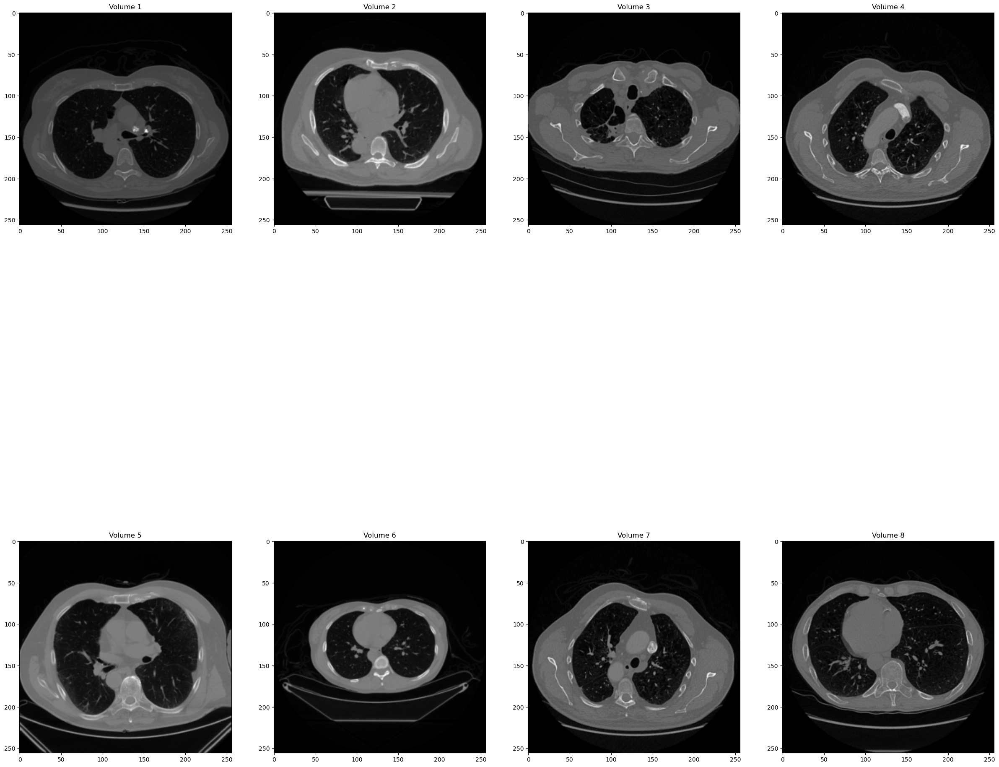

In [28]:
#Просмотр изображений
plt.figure("Visualization Train", (30, 30))

for batch_idx, (real, _) in enumerate(loader):
    if batch_idx == 0:
        print(real.shape)
        for i, image in enumerate(real):
            plt.subplot(2, 4, i+1)
            plt.title(f"Volume {i+1}")
            image = image[0, :, :]
            image = np.rot90(image, 2)
            plt.imshow(image, cmap="gray")
    

## **Обучение нейросетей**

In [11]:
def train_fn(critic, gen, loader, dataset, step, alpha,opt_critic,opt_gen, tensorboard_step, writer,scaler_gen,scaler_critic,):
    loop = tqdm(loader, leave=True)
    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]
        
        # Тренировка Критика: max E[critic(real)] - E[critic(fake)] <-> min -E[critic(real)] + E[critic(fake)]
        noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(DEVICE)
        
        with torch.cuda.amp.autocast():
            fake = gen(noise, alpha, step)
            critic_real = critic(real, alpha, step)
            critic_fake = critic(fake.detach(), alpha, step)
            gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake))
                + LAMBDA_GP * gp
                + (0.001 * torch.mean(critic_real ** 2))
            )
        
        # Обновление весов Критика
        opt_critic.zero_grad()
        scaler_critic.scale(loss_critic).backward()
        scaler_critic.step(opt_critic)
        scaler_critic.update()

        # Тренировка Генератора: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        with torch.cuda.amp.autocast():
            gen_fake = critic(fake, alpha, step)
            loss_gen = -torch.mean(gen_fake)
        
        # Обновление весов Генератора
        opt_gen.zero_grad()
        scaler_gen.scale(loss_gen).backward()
        scaler_gen.step(opt_gen)
        scaler_gen.update()

        # Обновление коэффициента alpha
        alpha += cur_batch_size / (
            (PROGRESSIVE_EPOCHS[step] * 0.5) * len(dataset)
        )
        alpha = min(alpha, 1)

        if batch_idx == 0:
                   
            with torch.no_grad():

                fixed_fakes = gen(FIXED_NOISE, alpha, step) * 0.5 + 0.5
                plot_to_tensorboard(
                  writer,
                  loss_critic.item(),
                  loss_gen.item(),
                  real.detach(),
                  fixed_fakes.detach(),
                  tensorboard_step,
              )
                tensorboard_step += 1
            
                     
        loop.set_postfix(
          gp=gp.item(),
          loss_critic=loss_critic.item(),
        )

    return tensorboard_step, alpha

## **Main**

In [14]:
# Инициализация Генератора и Критика
gen = Generator(
    Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)
critic = Critic(
    Z_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
).to(DEVICE)

# Инициализация оптимизатора и скейлера training
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99))
opt_critic = optim.Adam(
    critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
)
scaler_critic = torch.cuda.amp.GradScaler()
scaler_gen = torch.cuda.amp.GradScaler()

# для сохранения результата работы
writer = SummaryWriter(f"logs_progan")


gen.train()
critic.train()

tensorboard_step = 0
# начальный шаг соответсвует заданному начальному изображению
step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))
for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-5
    curent_image_size = 4 * 2 ** step
    loader, dataset = get_loader(curent_image_size)  # 4->0, 8->1, 16->2, 32->3, 64 -> 4
    print(f"Current image size: {curent_image_size}")

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        tensorboard_step, alpha = train_fn(
            critic,
            gen,
            loader,
            dataset,
            step,
            alpha,
            opt_critic,
            opt_gen,
            tensorboard_step,
            writer,
            scaler_gen,
            scaler_critic,
        )
    
    #Сохранение весов моделей критика и генератора
    torch.save(critic.state_dict(), f"../model/progan/progan{curent_image_size}_critic")
    torch.save(gen.state_dict(), f"../model/progan/progan{curent_image_size}_gen")
    
    step += 1  # отсливание прогресса для размера изображения



Current image size: 4
Epoch [1/30]


100%|██████████| 170/170 [00:22<00:00,  7.58it/s, gp=0.00675, loss_critic=-.174]


Epoch [2/30]


100%|██████████| 170/170 [00:13<00:00, 12.61it/s, gp=0.0193, loss_critic=0.103]  


Epoch [3/30]


100%|██████████| 170/170 [00:13<00:00, 13.01it/s, gp=0.0219, loss_critic=0.261]  


Epoch [4/30]


100%|██████████| 170/170 [00:14<00:00, 12.13it/s, gp=0.0219, loss_critic=0.0183]


Epoch [5/30]


100%|██████████| 170/170 [00:13<00:00, 12.91it/s, gp=0.0078, loss_critic=-.161]  


Epoch [6/30]


100%|██████████| 170/170 [00:13<00:00, 12.86it/s, gp=0.00484, loss_critic=0.0046] 


Epoch [7/30]


100%|██████████| 170/170 [00:13<00:00, 12.85it/s, gp=0.00625, loss_critic=-.0169] 


Epoch [8/30]


100%|██████████| 170/170 [00:13<00:00, 12.76it/s, gp=0.00952, loss_critic=0.175] 


Epoch [9/30]


100%|██████████| 170/170 [00:13<00:00, 12.69it/s, gp=0.011, loss_critic=0.151]     


Epoch [10/30]


100%|██████████| 170/170 [00:15<00:00, 10.93it/s, gp=0.0109, loss_critic=0.121]  


Epoch [11/30]


100%|██████████| 170/170 [00:14<00:00, 11.89it/s, gp=0.00572, loss_critic=0.0995]


Epoch [12/30]


100%|██████████| 170/170 [00:13<00:00, 12.20it/s, gp=0.0289, loss_critic=0.287]   


Epoch [13/30]


100%|██████████| 170/170 [00:14<00:00, 11.88it/s, gp=0.00461, loss_critic=0.0457] 


Epoch [14/30]


100%|██████████| 170/170 [00:14<00:00, 11.87it/s, gp=0.00775, loss_critic=0.0934]


Epoch [15/30]


100%|██████████| 170/170 [00:15<00:00, 11.33it/s, gp=0.00557, loss_critic=0.0411] 


Epoch [16/30]


100%|██████████| 170/170 [00:14<00:00, 12.00it/s, gp=0.0133, loss_critic=0.172]  


Epoch [17/30]


100%|██████████| 170/170 [00:13<00:00, 12.48it/s, gp=0.00451, loss_critic=0.0707] 


Epoch [18/30]


100%|██████████| 170/170 [00:13<00:00, 12.43it/s, gp=0.00377, loss_critic=0.0471]


Epoch [19/30]


100%|██████████| 170/170 [00:14<00:00, 11.99it/s, gp=0.00201, loss_critic=0.0145] 


Epoch [20/30]


100%|██████████| 170/170 [00:15<00:00, 11.26it/s, gp=0.00805, loss_critic=0.0958] 


Epoch [21/30]


100%|██████████| 170/170 [00:16<00:00, 10.52it/s, gp=0.00296, loss_critic=0.0436]  


Epoch [22/30]


100%|██████████| 170/170 [00:15<00:00, 10.66it/s, gp=0.00251, loss_critic=0.0448] 


Epoch [23/30]


100%|██████████| 170/170 [00:14<00:00, 11.39it/s, gp=0.0138, loss_critic=0.13]    


Epoch [24/30]


100%|██████████| 170/170 [00:14<00:00, 12.06it/s, gp=0.00305, loss_critic=0.023]  


Epoch [25/30]


100%|██████████| 170/170 [00:13<00:00, 12.37it/s, gp=0.00797, loss_critic=0.0956] 


Epoch [26/30]


100%|██████████| 170/170 [00:13<00:00, 12.65it/s, gp=0.0058, loss_critic=0.0671]  


Epoch [27/30]


100%|██████████| 170/170 [00:14<00:00, 12.08it/s, gp=0.00149, loss_critic=0.042]   


Epoch [28/30]


100%|██████████| 170/170 [00:14<00:00, 12.02it/s, gp=0.00256, loss_critic=0.0343]  


Epoch [29/30]


100%|██████████| 170/170 [00:14<00:00, 12.06it/s, gp=0.00102, loss_critic=0.0208]  


Epoch [30/30]


100%|██████████| 170/170 [00:14<00:00, 11.95it/s, gp=0.013, loss_critic=0.162]     


Current image size: 8
Epoch [1/30]


100%|██████████| 170/170 [00:15<00:00, 11.33it/s, gp=0.00224, loss_critic=0.144]   


Epoch [2/30]


100%|██████████| 170/170 [00:14<00:00, 11.43it/s, gp=0.000343, loss_critic=0.0408] 


Epoch [3/30]


100%|██████████| 170/170 [00:14<00:00, 12.09it/s, gp=0.00278, loss_critic=0.0443] 


Epoch [4/30]


100%|██████████| 170/170 [00:13<00:00, 12.21it/s, gp=0.000615, loss_critic=-.0838] 


Epoch [5/30]


100%|██████████| 170/170 [00:14<00:00, 11.91it/s, gp=0.00142, loss_critic=-.0351]  


Epoch [6/30]


100%|██████████| 170/170 [00:14<00:00, 11.83it/s, gp=0.000806, loss_critic=-.0302]


Epoch [7/30]


100%|██████████| 170/170 [00:13<00:00, 12.22it/s, gp=0.000551, loss_critic=-.0468] 


Epoch [8/30]


100%|██████████| 170/170 [00:13<00:00, 12.46it/s, gp=0.000992, loss_critic=0.0367] 


Epoch [9/30]


100%|██████████| 170/170 [00:14<00:00, 12.09it/s, gp=0.000685, loss_critic=0.00789] 


Epoch [10/30]


100%|██████████| 170/170 [00:13<00:00, 12.43it/s, gp=0.000882, loss_critic=0.0163] 


Epoch [11/30]


100%|██████████| 170/170 [00:14<00:00, 11.70it/s, gp=0.00152, loss_critic=0.0371]   


Epoch [12/30]


100%|██████████| 170/170 [00:14<00:00, 12.11it/s, gp=0.000747, loss_critic=0.0162] 


Epoch [13/30]


100%|██████████| 170/170 [00:14<00:00, 12.13it/s, gp=0.00125, loss_critic=0.0285]  


Epoch [14/30]


100%|██████████| 170/170 [00:14<00:00, 11.98it/s, gp=0.00209, loss_critic=0.0561]  


Epoch [15/30]


100%|██████████| 170/170 [00:14<00:00, 11.74it/s, gp=0.000918, loss_critic=0.000585]


Epoch [16/30]


100%|██████████| 170/170 [00:14<00:00, 11.58it/s, gp=0.00373, loss_critic=0.018]    


Epoch [17/30]


100%|██████████| 170/170 [00:14<00:00, 12.12it/s, gp=0.00155, loss_critic=-.00809]  


Epoch [18/30]


100%|██████████| 170/170 [00:14<00:00, 11.80it/s, gp=0.000753, loss_critic=-.0112]  


Epoch [19/30]


100%|██████████| 170/170 [00:14<00:00, 11.63it/s, gp=0.000933, loss_critic=-.0161] 


Epoch [20/30]


100%|██████████| 170/170 [00:14<00:00, 11.57it/s, gp=0.000535, loss_critic=-.0347]  


Epoch [21/30]


100%|██████████| 170/170 [00:14<00:00, 12.13it/s, gp=0.00159, loss_critic=-.000846] 


Epoch [22/30]


100%|██████████| 170/170 [00:13<00:00, 12.30it/s, gp=0.000683, loss_critic=0.0458]  


Epoch [23/30]


100%|██████████| 170/170 [00:13<00:00, 12.19it/s, gp=0.0023, loss_critic=-.0172]   


Epoch [24/30]


100%|██████████| 170/170 [00:14<00:00, 12.11it/s, gp=0.000349, loss_critic=-.0347]  


Epoch [25/30]


100%|██████████| 170/170 [00:14<00:00, 11.66it/s, gp=0.0012, loss_critic=0.00959]   


Epoch [26/30]


100%|██████████| 170/170 [00:14<00:00, 11.34it/s, gp=0.000564, loss_critic=-.00758] 


Epoch [27/30]


100%|██████████| 170/170 [00:14<00:00, 11.49it/s, gp=0.000325, loss_critic=-.0216]  


Epoch [28/30]


100%|██████████| 170/170 [00:13<00:00, 12.21it/s, gp=0.00237, loss_critic=-.0101]  


Epoch [29/30]


100%|██████████| 170/170 [00:14<00:00, 11.95it/s, gp=0.000442, loss_critic=-.0363] 


Epoch [30/30]


100%|██████████| 170/170 [00:14<00:00, 12.10it/s, gp=0.000802, loss_critic=-.0311]  


Current image size: 16
Epoch [1/30]


100%|██████████| 340/340 [00:24<00:00, 13.80it/s, gp=0.000561, loss_critic=-.0931]  


Epoch [2/30]


100%|██████████| 340/340 [00:24<00:00, 13.91it/s, gp=0.00138, loss_critic=-.0783]  


Epoch [3/30]


100%|██████████| 340/340 [00:24<00:00, 13.88it/s, gp=0.00178, loss_critic=-.0204]  


Epoch [4/30]


100%|██████████| 340/340 [00:24<00:00, 14.09it/s, gp=0.00158, loss_critic=-.0279]  


Epoch [5/30]


100%|██████████| 340/340 [00:23<00:00, 14.43it/s, gp=0.00206, loss_critic=-.0705] 


Epoch [6/30]


100%|██████████| 340/340 [00:23<00:00, 14.31it/s, gp=0.00339, loss_critic=-.0498] 


Epoch [7/30]


100%|██████████| 340/340 [00:23<00:00, 14.35it/s, gp=0.004, loss_critic=0.0947]    


Epoch [8/30]


100%|██████████| 340/340 [00:24<00:00, 14.10it/s, gp=0.00281, loss_critic=-.0645]  


Epoch [9/30]


100%|██████████| 340/340 [00:23<00:00, 14.18it/s, gp=0.00284, loss_critic=-.00635] 


Epoch [10/30]


100%|██████████| 340/340 [00:24<00:00, 13.92it/s, gp=0.00351, loss_critic=-.0657]  


Epoch [11/30]


100%|██████████| 340/340 [00:24<00:00, 13.82it/s, gp=0.0027, loss_critic=-.0952]   


Epoch [12/30]


100%|██████████| 340/340 [00:24<00:00, 14.02it/s, gp=0.00371, loss_critic=-.0467]  


Epoch [13/30]


100%|██████████| 340/340 [00:23<00:00, 14.25it/s, gp=0.00352, loss_critic=-.177]   


Epoch [14/30]


100%|██████████| 340/340 [00:24<00:00, 14.15it/s, gp=0.00365, loss_critic=-.09]    


Epoch [15/30]


100%|██████████| 340/340 [00:24<00:00, 14.15it/s, gp=0.00236, loss_critic=-.166]  


Epoch [16/30]


100%|██████████| 340/340 [00:23<00:00, 14.18it/s, gp=0.00342, loss_critic=-.0786]  


Epoch [17/30]


100%|██████████| 340/340 [00:24<00:00, 14.11it/s, gp=0.00164, loss_critic=-.154]  


Epoch [18/30]


100%|██████████| 340/340 [00:25<00:00, 13.16it/s, gp=0.0029, loss_critic=-.0766]  


Epoch [19/30]


100%|██████████| 340/340 [00:23<00:00, 14.21it/s, gp=0.00661, loss_critic=0.0124]  


Epoch [20/30]


100%|██████████| 340/340 [00:25<00:00, 13.59it/s, gp=0.00301, loss_critic=-.00615] 


Epoch [21/30]


100%|██████████| 340/340 [00:24<00:00, 13.97it/s, gp=0.00633, loss_critic=-.0967]  


Epoch [22/30]


100%|██████████| 340/340 [00:25<00:00, 13.55it/s, gp=0.00371, loss_critic=-.107]   


Epoch [23/30]


100%|██████████| 340/340 [00:24<00:00, 14.05it/s, gp=0.00604, loss_critic=-.16]   


Epoch [24/30]


100%|██████████| 340/340 [00:24<00:00, 13.97it/s, gp=0.00411, loss_critic=-.11]   


Epoch [25/30]


100%|██████████| 340/340 [00:24<00:00, 14.10it/s, gp=0.00345, loss_critic=-.113]   


Epoch [26/30]


100%|██████████| 340/340 [00:24<00:00, 13.98it/s, gp=0.0068, loss_critic=-.15]     


Epoch [27/30]


100%|██████████| 340/340 [00:24<00:00, 14.07it/s, gp=0.00475, loss_critic=-.131]  


Epoch [28/30]


100%|██████████| 340/340 [00:24<00:00, 14.14it/s, gp=0.00535, loss_critic=-.118]  


Epoch [29/30]


100%|██████████| 340/340 [00:23<00:00, 14.23it/s, gp=0.00322, loss_critic=-.153]  


Epoch [30/30]


100%|██████████| 340/340 [00:24<00:00, 13.96it/s, gp=0.00369, loss_critic=-.216]   


Current image size: 32
Epoch [1/30]


100%|██████████| 340/340 [00:46<00:00,  7.39it/s, gp=0.0218, loss_critic=-1.04]  


Epoch [2/30]


100%|██████████| 340/340 [00:46<00:00,  7.33it/s, gp=0.00393, loss_critic=-.403] 


Epoch [3/30]


100%|██████████| 340/340 [00:46<00:00,  7.32it/s, gp=0.00401, loss_critic=-.585] 


Epoch [4/30]


100%|██████████| 340/340 [00:46<00:00,  7.24it/s, gp=0.00548, loss_critic=-.382]  


Epoch [5/30]


100%|██████████| 340/340 [00:46<00:00,  7.36it/s, gp=0.00446, loss_critic=-.354] 


Epoch [6/30]


100%|██████████| 340/340 [00:46<00:00,  7.30it/s, gp=0.00697, loss_critic=-.127] 


Epoch [7/30]


100%|██████████| 340/340 [00:46<00:00,  7.28it/s, gp=0.00889, loss_critic=-.242] 


Epoch [8/30]


100%|██████████| 340/340 [00:46<00:00,  7.30it/s, gp=0.00483, loss_critic=-.588]   


Epoch [9/30]


100%|██████████| 340/340 [00:46<00:00,  7.35it/s, gp=0.00738, loss_critic=-.531] 


Epoch [10/30]


100%|██████████| 340/340 [00:46<00:00,  7.32it/s, gp=0.00492, loss_critic=-.594] 


Epoch [11/30]


100%|██████████| 340/340 [00:47<00:00,  7.17it/s, gp=0.00656, loss_critic=-.478] 


Epoch [12/30]


100%|██████████| 340/340 [00:46<00:00,  7.35it/s, gp=0.0126, loss_critic=-.63]   


Epoch [13/30]


100%|██████████| 340/340 [00:46<00:00,  7.38it/s, gp=0.0039, loss_critic=-.602]  


Epoch [14/30]


100%|██████████| 340/340 [00:46<00:00,  7.33it/s, gp=0.00659, loss_critic=-.64]  


Epoch [15/30]


100%|██████████| 340/340 [00:46<00:00,  7.27it/s, gp=0.00522, loss_critic=-.162] 


Epoch [16/30]


100%|██████████| 340/340 [00:47<00:00,  7.21it/s, gp=0.00526, loss_critic=-.371] 


Epoch [17/30]


100%|██████████| 340/340 [00:46<00:00,  7.30it/s, gp=0.0069, loss_critic=-.635]  


Epoch [18/30]


100%|██████████| 340/340 [00:46<00:00,  7.29it/s, gp=0.0102, loss_critic=-.117]  


Epoch [19/30]


100%|██████████| 340/340 [00:46<00:00,  7.25it/s, gp=0.00689, loss_critic=-.419] 


Epoch [20/30]


100%|██████████| 340/340 [00:47<00:00,  7.21it/s, gp=0.00521, loss_critic=-.699]  


Epoch [21/30]


100%|██████████| 340/340 [00:47<00:00,  7.15it/s, gp=0.0032, loss_critic=-.347]  


Epoch [22/30]


100%|██████████| 340/340 [00:47<00:00,  7.11it/s, gp=0.00973, loss_critic=-.328] 


Epoch [23/30]


100%|██████████| 340/340 [00:48<00:00,  7.04it/s, gp=0.0137, loss_critic=-.564]   


Epoch [24/30]


100%|██████████| 340/340 [00:47<00:00,  7.13it/s, gp=0.00409, loss_critic=-.353]   


Epoch [25/30]


100%|██████████| 340/340 [00:47<00:00,  7.21it/s, gp=0.0083, loss_critic=-.534]   


Epoch [26/30]


100%|██████████| 340/340 [00:47<00:00,  7.21it/s, gp=0.00774, loss_critic=-.183] 


Epoch [27/30]


100%|██████████| 340/340 [00:46<00:00,  7.31it/s, gp=0.0147, loss_critic=-.276] 


Epoch [28/30]


100%|██████████| 340/340 [00:46<00:00,  7.30it/s, gp=0.0116, loss_critic=-.596]  


Epoch [29/30]


100%|██████████| 340/340 [00:46<00:00,  7.29it/s, gp=0.00717, loss_critic=-.413] 


Epoch [30/30]


100%|██████████| 340/340 [00:46<00:00,  7.28it/s, gp=0.0063, loss_critic=-.337]  


Current image size: 64
Epoch [1/30]


100%|██████████| 680/680 [02:23<00:00,  4.75it/s, gp=0.00869, loss_critic=-2.65]  


Epoch [2/30]


100%|██████████| 680/680 [02:23<00:00,  4.75it/s, gp=0.00773, loss_critic=-1.65] 


Epoch [3/30]


100%|██████████| 680/680 [02:22<00:00,  4.76it/s, gp=0.0134, loss_critic=-.845]  


Epoch [4/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.0266, loss_critic=-1.3]   


Epoch [5/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.00809, loss_critic=-1.49]  


Epoch [6/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.0128, loss_critic=-.691]  


Epoch [7/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.0242, loss_critic=0.222]  


Epoch [8/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.00602, loss_critic=-1.01] 


Epoch [9/30]


100%|██████████| 680/680 [02:22<00:00,  4.76it/s, gp=0.0096, loss_critic=-2.2]  


Epoch [10/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.0122, loss_critic=-2.54]  


Epoch [11/30]


100%|██████████| 680/680 [02:22<00:00,  4.79it/s, gp=0.0258, loss_critic=-1.26] 


Epoch [12/30]


100%|██████████| 680/680 [02:21<00:00,  4.79it/s, gp=0.0115, loss_critic=-1.51]  


Epoch [13/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.0186, loss_critic=0.044] 


Epoch [14/30]


100%|██████████| 680/680 [02:22<00:00,  4.76it/s, gp=0.0159, loss_critic=-1.06] 


Epoch [15/30]


100%|██████████| 680/680 [02:22<00:00,  4.76it/s, gp=0.0232, loss_critic=-.206]   


Epoch [16/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.00744, loss_critic=-1.29] 


Epoch [17/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.0118, loss_critic=-1.43]  


Epoch [18/30]


100%|██████████| 680/680 [02:21<00:00,  4.79it/s, gp=0.00474, loss_critic=-.89] 


Epoch [19/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.0212, loss_critic=-1.73] 


Epoch [20/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.0112, loss_critic=-2.11]  


Epoch [21/30]


100%|██████████| 680/680 [02:22<00:00,  4.78it/s, gp=0.0141, loss_critic=-1.92] 


Epoch [22/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.0106, loss_critic=-1.61]   


Epoch [23/30]


100%|██████████| 680/680 [02:22<00:00,  4.79it/s, gp=0.0203, loss_critic=-1.68]  


Epoch [24/30]


100%|██████████| 680/680 [02:22<00:00,  4.79it/s, gp=0.011, loss_critic=-1.19]  


Epoch [25/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.0105, loss_critic=-.88]   


Epoch [26/30]


100%|██████████| 680/680 [02:22<00:00,  4.76it/s, gp=0.0175, loss_critic=-2.24]  


Epoch [27/30]


100%|██████████| 680/680 [02:22<00:00,  4.76it/s, gp=0.0199, loss_critic=-2.03] 


Epoch [28/30]


100%|██████████| 680/680 [02:22<00:00,  4.77it/s, gp=0.00705, loss_critic=-1.21]


Epoch [29/30]


100%|██████████| 680/680 [02:21<00:00,  4.79it/s, gp=0.0238, loss_critic=-2.18]  


Epoch [30/30]


100%|██████████| 680/680 [02:22<00:00,  4.79it/s, gp=0.0116, loss_critic=-1.36]  


Current image size: 128
Epoch [1/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0201, loss_critic=-4.52]  


Epoch [2/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0339, loss_critic=-1.21] 


Epoch [3/30]


100%|██████████| 680/680 [05:09<00:00,  2.20it/s, gp=0.0538, loss_critic=-3.3] 


Epoch [4/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0476, loss_critic=-3.94] 


Epoch [5/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0594, loss_critic=-3.73]


Epoch [6/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0484, loss_critic=-2.89]  


Epoch [7/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0445, loss_critic=-3.51] 


Epoch [8/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0746, loss_critic=-5.12]


Epoch [9/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0393, loss_critic=-.299]


Epoch [10/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0462, loss_critic=-3]   


Epoch [11/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0391, loss_critic=-4.46] 


Epoch [12/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0505, loss_critic=-2.57] 


Epoch [13/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0304, loss_critic=-3.74] 


Epoch [14/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0582, loss_critic=-4.14]


Epoch [15/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0335, loss_critic=-5.23]


Epoch [16/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0549, loss_critic=-4]    


Epoch [17/30]


100%|██████████| 680/680 [05:08<00:00,  2.21it/s, gp=0.0662, loss_critic=-3.63]


Epoch [18/30]


100%|██████████| 680/680 [05:08<00:00,  2.21it/s, gp=0.0219, loss_critic=-4.07]


Epoch [19/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0498, loss_critic=-4.22]


Epoch [20/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0643, loss_critic=-4.57] 


Epoch [21/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0207, loss_critic=-1.34] 


Epoch [22/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0526, loss_critic=-1.61]


Epoch [23/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0787, loss_critic=-3.27]


Epoch [24/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0918, loss_critic=-1.43] 


Epoch [25/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0857, loss_critic=-4.87] 


Epoch [26/30]


100%|██████████| 680/680 [05:09<00:00,  2.20it/s, gp=0.0328, loss_critic=-3.99] 


Epoch [27/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0703, loss_critic=-5.01]


Epoch [28/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0599, loss_critic=-3.57]


Epoch [29/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0373, loss_critic=-6.09]


Epoch [30/30]


100%|██████████| 680/680 [05:08<00:00,  2.20it/s, gp=0.0794, loss_critic=-1.77]


Current image size: 256
Epoch [1/30]


100%|██████████| 1360/1360 [16:24<00:00,  1.38it/s, gp=0.34, loss_critic=-11.4]  


Epoch [2/30]


100%|██████████| 1360/1360 [16:22<00:00,  1.38it/s, gp=0.377, loss_critic=-13.8] 


Epoch [3/30]


100%|██████████| 1360/1360 [16:21<00:00,  1.39it/s, gp=0.24, loss_critic=-15.2]  


Epoch [4/30]


100%|██████████| 1360/1360 [16:22<00:00,  1.38it/s, gp=0.166, loss_critic=-15.3] 


Epoch [5/30]


100%|██████████| 1360/1360 [16:22<00:00,  1.38it/s, gp=0.105, loss_critic=-15]   


Epoch [6/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.221, loss_critic=-6.77] 


Epoch [7/30]


100%|██████████| 1360/1360 [16:22<00:00,  1.38it/s, gp=0.152, loss_critic=-11.8] 


Epoch [8/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.154, loss_critic=-2.72] 


Epoch [9/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.2, loss_critic=-12.6]   


Epoch [10/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.305, loss_critic=-26.3] 


Epoch [11/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.11, loss_critic=-11.3]  


Epoch [12/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.129, loss_critic=-10.2] 


Epoch [13/30]


100%|██████████| 1360/1360 [16:23<00:00,  1.38it/s, gp=0.212, loss_critic=-13]   


Epoch [14/30]


100%|██████████| 1360/1360 [16:28<00:00,  1.38it/s, gp=0.226, loss_critic=-6.62] 


Epoch [15/30]


100%|██████████| 1360/1360 [16:28<00:00,  1.38it/s, gp=0.195, loss_critic=-7.22] 


Epoch [16/30]


 72%|███████▏  | 984/1360 [11:54<04:32,  1.38it/s, gp=0.181, loss_critic=-14.3] 


KeyboardInterrupt: 

In [15]:
#Сохранение весов моделей критика и генератора
torch.save(critic.state_dict(), "../model/progan/progan256_critic")
torch.save(gen.state_dict(), "../model/progan/progan256_gen")

##**Просмортр результата**

In [ ]:
!ki

In [16]:
%tensorboard --logdir logs_progan